In [60]:

#data processing
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

#models
from quantile_forest import RandomForestQuantileRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import HistGradientBoostingRegressor

#data analysis
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
import scipy.stats as stats
from sklearn.linear_model import Ridge

#graphing
import matplotlib.pyplot as plt
import altair as alt
alt.data_transformers.enable("default")
alt.data_transformers.disable_max_rows()

#save models for upload
import seaborn as sns
import joblib
import os


Loading in the Dataset

In [89]:
df = pd.read_csv("exofop_tess_tois_all.csv")
print(df.head())
print(df.shape)

         tid     toi  pl_mass  ... st_feherr  st_mass  st_masserr
0  231663901  101.01   115.19  ...       NaN     1.05    0.129454
1  149603524  102.01   317.00  ...      0.05     1.28    0.190812
2  336732616  103.01   116.75  ...       NaN     1.27    0.196969
3  231670397  104.01   121.75  ...       NaN     1.16    0.166129
4  144065872  105.01   122.95  ...       NaN     1.03    0.127209

[5 rows x 39 columns]
(7576, 39)


Preprocessing Data

In [91]:
df['tfopwg_disp'].replace(to_replace='FA', value='FP', inplace=True)
df['tfopwg_disp'].replace(to_replace='KP', value='CP', inplace=True)
df['tfopwg_disp'].replace(to_replace='CP', value=1, inplace=True)
df['tfopwg_disp'].replace(to_replace='FP', value=0, inplace=True)

# Drop the null columns where all values are null
df = df.dropna(axis='columns', how='all')

# Create a boolean mask to keep rows where 'col1' is 0 or 1
mask = (df['tfopwg_disp'] == 0) | (df['tfopwg_disp'] == 1)
# Filter the DataFrame to keep only the rows where the mask is True (removes all planet candidates)
df = df[mask]

#drop rows with planet mass over 300 mEarth
df = df[df['pl_mass'] < 300]

df.to_csv('tess_data.csv',index=False)
df.head()

rows, cols = df.shape
print(f"Number of rows: {rows}")
print(f"Number of columns: {cols}")

num_CP=0
num_FP=0

for i in df['tfopwg_disp'] :
    if i==1:
        num_CP=num_CP+1
    if i==0 :
        num_FP=num_FP+1
    
print('CP:', num_CP)
print('FP:', num_FP)

Number of rows: 1859
Number of columns: 39
CP: 959
FP: 900


C:\Users\Lauren\AppData\Local\Temp\ipykernel_7556\2870140503.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['tfopwg_disp'].replace(to_replace='FA', value='FP', inplace=True)
C:\Users\Lauren\AppData\Local\Temp\ipykernel_7556\2870140503.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves

In [87]:
df = pd.read_csv("tess_data.csv")

#drop rows with empty mass or radius values
df = df[df['pl_rade'] != pd.NA]
df = df[df['pl_mass'] != pd.NA]


#move radius errors to new df for later performance values
drop_features = ['pl_radeerr'] 
radius_err = df[['pl_radeerr']]
column_means = radius_err.mean()
radius_err = radius_err.fillna(column_means) #fill NAs with means in radius err

df = df.drop(columns = drop_features) #drop radius error from main df

#handle NAs
df['tfopwg_disp'] = df['tfopwg_disp'].fillna(0) #fill NAs in disposition with 0

exclude_columns = 'tfopwg_disp'
columns_to_fill = df.columns.difference([exclude_columns])
means = df[columns_to_fill].mean()
df[columns_to_fill] = df[columns_to_fill].fillna(means) #fill NAs in all other columns with mean

df = df.drop(columns = 'tfopwg_disp')

#print updated df
print(df.head())
rows, cols = df.shape
print(f"Number of rows: {rows}")
print(f"Number of columns: {cols}")

print(df.columns)


         tid     toi  pl_mass  st_tmag  ...  st_feh  st_feherr  st_mass  st_masserr
0  231663901  101.01   115.19  12.4069  ...  0.0027   0.058435     1.05    0.129454
1  336732616  103.01   116.75  11.5232  ...  0.0027   0.058435     1.27    0.196969
2  231670397  104.01   121.75   9.8638  ...  0.0027   0.058435     1.16    0.166129
3  144065872  105.01   122.95   9.4995  ...  0.0027   0.058435     1.03    0.127209
4  289793076  108.01    99.64  13.1630  ...  0.0027   0.058435     0.95    0.135858

[5 rows x 37 columns]
Number of rows: 1859
Number of columns: 37
Index(['tid', 'toi', 'pl_mass', 'st_tmag', 'st_tmagerr', 'ra', 'dec', 'pmra',
       'pmraerr', 'pmdec', 'pmdecerr', 'pl_tranepoch', 'pl_tranepocherr',
       'pl_orbper', 'pl_orbpererr', 'pl_trandurh', 'pl_trandurherr',
       'pl_trandepmmag', 'pl_trandepmmagerr', 'pl_trandep', 'pl_trandeperr',
       'pl_rade', 'pl_insol', 'pl_eqt', 'pl_snr', 'st_dist', 'st_disterr',
       'st_teff', 'st_tefferr', 'st_logg', 'st_loggerr', 

Splitting Up Data

In [64]:
random_state = np.random.RandomState(0)

#set quantiles for model to calculate
quantiles = [.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95]

#set target
target_columns = ["pl_mass", "pl_rade"]

X = df.drop(columns=target_columns)
y = df[target_columns]

#75% of data training set and 25% of data testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=random_state)

In [66]:
# store predictions per target and quantile
all_preds_log = {}  # format: all_preds_log["pl_mass"]["qrf"] = np.ndarray
all_preds_log_errors = {}

for target in target_columns:
    print(f"\nTarget: {target}")
    
    # step 1: log-transform target
    y_train_log = np.log10(y_train[target])
    y_test_log = np.log10(y_test[target])
    
    # step 2: fit QRF for multiple quantiles
    qrf = RandomForestQuantileRegressor()
    qrf.fit(X_train, y_train_log)
    qrf_preds = np.stack([qrf.predict(X_test, q) for q in quantiles], axis=1)

    name=''
    if target == 'pl_rade' : 
        name = "rade"
    if target == 'pl_mass':
        name = "mass"
    joblib.dump(qrf,'models/qrf_'+name+"_model.pkl") #save the qrf model for loading
    
    
    # step 3: fit HistGradientBoostingRegressor for each quantile
    hgb_preds = np.zeros_like(qrf_preds)
    for i, q in enumerate(quantiles):
        hgb = HistGradientBoostingRegressor(loss='quantile', quantile=q, max_iter=200)
        hgb.fit(X_train, y_train_log)
        hgb_preds[:, i] = hgb.predict(X_test)

        number = q
        string_number = "models/hgb_"+name+"_q_%s.pkl" % number
        joblib.dump(hgb,string_number) #save the hgb model for loading

    
    # step 4: stack 0.5 quantile predictions (median)
    stacked_X = np.vstack([
        qrf_preds[:, 9],  # 0.5 quantile from qrf
        hgb_preds[:, 9]   # 0.5 quantile from HistGradientBoostingRegressor
    ]).T
    
    meta_model = Ridge()
    meta_model.fit(stacked_X, y_test_log)
    final_pred_log = meta_model.predict(stacked_X)
    
    # step 5: inverse transform & compute error bars of median for graph
    final_pred = 10**final_pred_log
   
    lower_bound = 10**np.mean([qrf_preds[:, 0], hgb_preds[:, 4]], axis=0)  # 0.25
    upper_bound = 10**np.mean([qrf_preds[:, 2], hgb_preds[:, 14]], axis=0)  # 0.75
    
    r2 = r2_score(y_test[target], final_pred) #r^2 score for median value
    print(f"R² Score (stacked): {r2:.4f}")
    
    #store predictions 
    all_preds_log[target] = {
        "qrf": qrf_preds,
        "hgb": hgb_preds,
        "true": y_test[target].values
    }

    #store predictions for graphing
    all_preds_log_errors[target] = {
        "pred": final_pred,
        "true": y_test[target].values,
        "lower": lower_bound,
        "upper": upper_bound
    }


Target: pl_mass
R² Score (stacked): 0.8986

Target: pl_rade
R² Score (stacked): 0.9264


Stacked Median Prediction Graph with %50 Inverval (q25-q75)

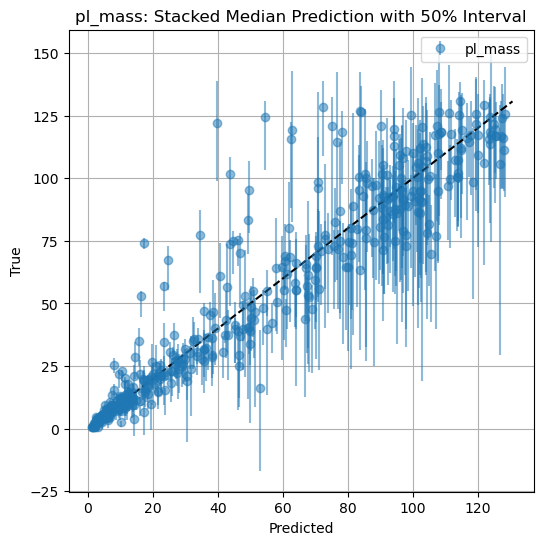

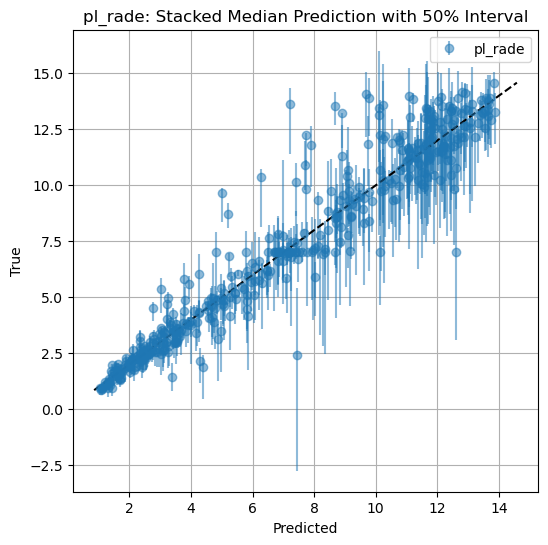

In [67]:
for target in target_columns:
    res = all_preds_log_errors[target]
    plt.figure(figsize=(6, 6))
    
    lower_err = np.abs(res["pred"] - res["lower"])
    upper_err = np.abs(res["upper"] - res["pred"])
    
    plt.errorbar(res["pred"], res["true"], 
                 yerr=[lower_err, upper_err],
                 fmt='o', alpha=0.5, label=target)
    
    plt.plot([min(res["true"]), max(res["true"])], [min(res["true"]), max(res["true"])], 'k--')
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(f"{target}: Stacked Median Prediction with 50% Interval")
    plt.legend()
    plt.grid(True)
    plt.show()

Save Predictions as a Dataframe for Performance Analysis

In [68]:
rows = []

for q_idx, q in enumerate(quantiles):
    for i in range(len(X_test)):
        row = {
            "X_test_index": X_test.index[i],
            "quantile": q,
            "pl_mass_pred": 10 ** np.mean([ #inverse log10 mass predictions
                all_preds_log["pl_mass"]["qrf"][i, q_idx],
                all_preds_log["pl_mass"]["hgb"][i, q_idx]
            ]),
            "pl_rade_pred": 10 ** np.mean([ #inverse log10 radius predictions
                all_preds_log["pl_rade"]["qrf"][i, q_idx],
                all_preds_log["pl_rade"]["hgb"][i, q_idx]
            ]),
            "pl_mass": all_preds_log["pl_mass"]["true"][i], #true mass and radius values 
            "pl_rade": all_preds_log["pl_rade"]["true"][i]
        }
        rows.append(row)

predictions_df = pd.DataFrame(rows) 
#note: the true mass and radius values in this df are NOT in quantiles like the predictions are
print(predictions_df.head())
print(predictions_df.size)

# 🔹 Save Predictions to CSV
predictions_df.to_csv("multi_target_quantile_predictions.csv", index=False)


#making a csv file of only the median values
# make new df where quantiles only equal 0.5
predictions_median_df = predictions_df[predictions_df['quantile'] == 0.500]

# 🔹 Save Predictions to CSV
predictions_median_df.to_csv("multi_target_quantile_median_predictions.csv", index=False)
print(predictions_median_df.head())
print(predictions_median_df.size)



   X_test_index  quantile  pl_mass_pred  pl_rade_pred  pl_mass   pl_rade
0          1224      0.05     20.772147      5.013351    29.55   5.94241
1           475      0.05     27.925338      5.294883    77.13  10.41700
2          1838      0.05      4.569936      1.848551     4.41   1.92318
3          1199      0.05      4.817378      2.337967     9.30   3.01287
4            53      0.05      4.660516      1.971354     7.04   2.54474
53010
      X_test_index  quantile  pl_mass_pred  pl_rade_pred  pl_mass   pl_rade
4185          1224       0.5     26.673359      5.383160    29.55   5.94241
4186           475       0.5     65.183550      8.864979    77.13  10.41700
4187          1838       0.5      4.880113      2.063088     4.41   1.92318
4188          1199       0.5      7.639738      2.973042     9.30   3.01287
4189            53       0.5      7.397386      2.849678     7.04   2.54474
2790


In [69]:
#since we saved the previous mass error values (not mass because there are no provided errors for mass)
#the true values for radius will be changed to its respected quantile for that row

indexes = predictions_df[['X_test_index']]
indexes = indexes.drop_duplicates(subset=['X_test_index'], ignore_index=True)
test_errors_df = pd.DataFrame(columns=['X_test_index','pl_radeerr'])

for index, row in indexes.iterrows(): 
    index_to_call = indexes.loc[index,'X_test_index']
    rad_err = radius_err.loc[index_to_call,"pl_radeerr"]
    new_row = pd.DataFrame({'X_test_index':[index_to_call],'pl_radeerr':[rad_err]})

    test_errors_df = pd.concat([test_errors_df, new_row], ignore_index=True)  


merged_df = predictions_df.merge(test_errors_df[['X_test_index', 'pl_radeerr']], on='X_test_index', how='left')

if merged_df['pl_radeerr'].isnull().any():
    print("Warning: Some radius_error values could not be matched.")


# compute true quantile radius from mean and error
merged_df['pl_rade'] = merged_df['pl_rade'] + stats.norm.ppf(merged_df['quantile']) * merged_df['pl_radeerr']

print(merged_df.head())
merged_df.to_csv("quantile_predictions.csv", index=False) 


  X_test_index  quantile  pl_mass_pred  ...  pl_mass   pl_rade  pl_radeerr
0         1224      0.05     20.772147  ...    29.55  4.969543    0.591461
1          475      0.05     27.925338  ...    77.13  9.318144    0.668057
2         1838      0.05      4.569936  ...     4.41  1.632337    0.176820
3         1199      0.05      4.817378  ...     9.30  2.435090    0.351265
4           53      0.05      4.660516  ...     7.04  2.142776    0.244377

[5 rows x 7 columns]


C:\Users\Lauren\AppData\Local\Temp\ipykernel_7556\1342251231.py:13: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test_errors_df = pd.concat([test_errors_df, new_row], ignore_index=True)


Pinball Loss, Interval Width, and Interval Coverage

In [70]:
#calculates pinball loss for each quantile, interval width, and interval coverage
df = pd.read_csv("quantile_predictions.csv")

# pivot so we have one row per planet with columns for each quantile
mass_wide = df.pivot(index='X_test_index', columns='quantile', values='pl_mass_pred')
radius_wide = df.pivot(index='X_test_index', columns='quantile', values='pl_rade_pred')

# real values
real_mass = df.drop_duplicates('X_test_index').set_index('X_test_index')['pl_mass']
real_radius = df.drop_duplicates('X_test_index').set_index('X_test_index')['pl_rade_pred']

# match to wide tables
mass_wide['real'] = real_mass
radius_wide['real'] = real_radius

# Pinball Loss Function
def pinball_loss(y_true, y_pred, q):
    diff = y_true - y_pred
    return np.mean(np.maximum(q * diff, (q - 1) * diff))


# evaluate target (mass or radius)
def evaluate_quantile_regression(df_qwide, label=""):
    results = {}
    qs = [col for col in df_qwide.columns if isinstance(col, float)]

    # pinball loss for each quantile
    for q in qs:
        loss = pinball_loss(df_qwide['real'], df_qwide[q], q)
        results[f"{label}_pinball_loss_q{int(q*100)}"] = loss

    # interval coverage and width (between 10th and 90th percentiles)
    q_low, q_high = 0.1, 0.9
    if q_low in df_qwide.columns and q_high in df_qwide.columns:
        in_interval = (df_qwide['real'] >= df_qwide[q_low]) & (df_qwide['real'] <= df_qwide[q_high])
        results[f"{label}_interval_coverage_10_90"] = np.mean(in_interval)
        results[f"{label}_interval_width_10_90"] = np.mean(df_qwide[q_high] - df_qwide[q_low])
    else:
        print(f"Missing quantiles {q_low} or {q_high} for interval metrics.")

    return results

# run evaluations
mass_results = evaluate_quantile_regression(mass_wide, label="mass")
radius_results = evaluate_quantile_regression(radius_wide, label="radius")

# combine and print
all_results = {**mass_results, **radius_results}


print("\n Evaluation Metrics:")
for k, v in all_results.items():
    print(f"{k}: {v:.5f}")
    


 Evaluation Metrics:
mass_pinball_loss_q5: 1.15929
mass_pinball_loss_q10: 1.83918
mass_pinball_loss_q15: 2.28813
mass_pinball_loss_q20: 2.75966
mass_pinball_loss_q25: 3.11238
mass_pinball_loss_q30: 3.30995
mass_pinball_loss_q35: 3.63944
mass_pinball_loss_q40: 3.79827
mass_pinball_loss_q45: 3.91605
mass_pinball_loss_q50: 3.88343
mass_pinball_loss_q55: 3.97551
mass_pinball_loss_q60: 4.12734
mass_pinball_loss_q65: 4.04498
mass_pinball_loss_q70: 4.02701
mass_pinball_loss_q75: 3.65085
mass_pinball_loss_q80: 3.36569
mass_pinball_loss_q85: 2.96326
mass_pinball_loss_q90: 2.43901
mass_pinball_loss_q95: 1.72293
mass_interval_coverage_10_90: 0.81935
mass_interval_width_10_90: 28.40181
radius_pinball_loss_q5: 0.00000
radius_pinball_loss_q10: 0.56275
radius_pinball_loss_q15: 0.71241
radius_pinball_loss_q20: 0.84890
radius_pinball_loss_q25: 0.93847
radius_pinball_loss_q30: 0.97418
radius_pinball_loss_q35: 1.00109
radius_pinball_loss_q40: 0.99191
radius_pinball_loss_q45: 0.98150
radius_pinball_loss_

Quantile Calibration Chart

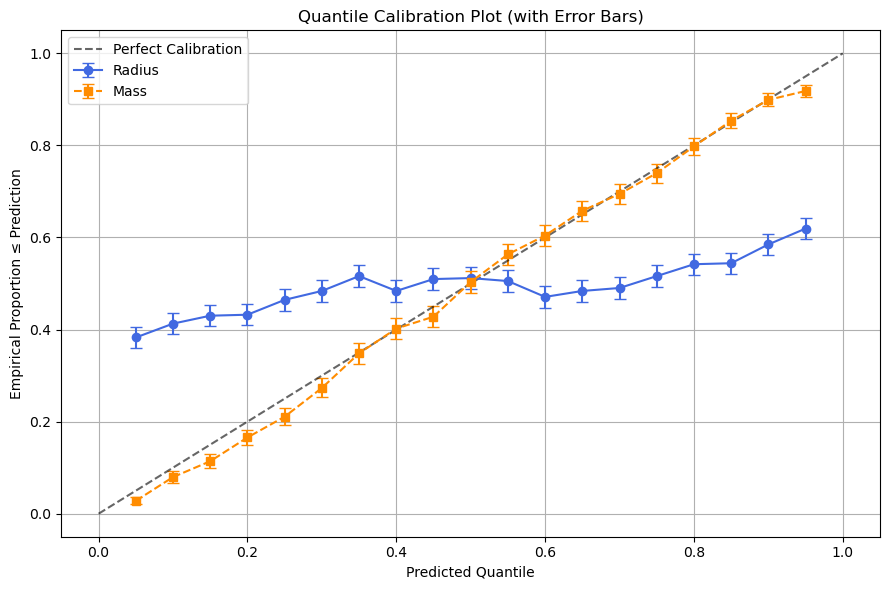

In [71]:
df = pd.read_csv("quantile_predictions.csv")

# define quantiles and sort
quantiles = np.sort(df['quantile'].unique())

# arrays to store results
radius_props = []
mass_props = []
radius_stderr = []
mass_stderr = []

# group by quantile
for q in quantiles:
    subset = df[df['quantile'] == q]

    # proportions of true values ≤ predicted
    radius_below = subset['pl_rade'] <= subset['pl_rade_pred']
    mass_below = subset['pl_mass'] <= subset['pl_mass_pred']

    # mean and standard error
    r_mean = np.mean(radius_below)
    r_err = np.std(radius_below, ddof=1) / np.sqrt(len(radius_below))

    m_mean = np.mean(mass_below)
    m_err = np.std(mass_below, ddof=1) / np.sqrt(len(mass_below))

    radius_props.append(r_mean)
    radius_stderr.append(r_err)

    mass_props.append(m_mean)
    mass_stderr.append(m_err)


# plot calibration with error bars
plt.figure(figsize=(9, 6))

plt.errorbar(quantiles, radius_props, yerr=radius_stderr, fmt='o-', capsize=4, label='Radius', color='royalblue')
plt.errorbar(quantiles, mass_props, yerr=mass_stderr, fmt='s--', capsize=4, label='Mass', color='darkorange')

plt.plot([0, 1], [0, 1], 'k--', alpha=0.6, label='Perfect Calibration')

plt.xlabel("Predicted Quantile")
plt.ylabel("Empirical Proportion ≤ Prediction")
plt.title("Quantile Calibration Plot (with Error Bars)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Interval Width and Coverage

In [72]:
df = pd.read_csv("quantile_predictions.csv")

# filter quantile = 0.1 and 0.9 rows
df_10 = df[df['quantile'] == 0.1].set_index('X_test_index')
df_90 = df[df['quantile'] == 0.9].set_index('X_test_index')

# rename for clarity
df_interval = df_10[['pl_rade_pred', 'pl_mass_pred']].rename(columns={
    'pl_rade_pred': 'radius_q10',
    'pl_mass_pred': 'mass_q10'
})

df_interval['radius_q90'] = df_90['pl_rade_pred']
df_interval['mass_q90'] = df_90['pl_mass_pred']

# add true values
df_interval['pl_rade'] = df_10['pl_rade']  
df_interval['pl_mass'] = df_10['pl_mass']      

# calculate coverage
radius_covered = (df_interval['pl_rade'] >= df_interval['radius_q10']) & \
                 (df_interval['pl_rade'] <= df_interval['radius_q90'])

mass_covered = (df_interval['pl_mass'] >= df_interval['mass_q10']) & \
               (df_interval['pl_mass'] <= df_interval['mass_q90'])

print("\nInterval Coverage (10th–90th Percentile):")
print(f"Radius: {radius_covered.mean():.3f}")
print(f"Mass  : {mass_covered.mean():.3f}")


# calculate interval width 
mass_width = (df_interval['mass_q90'] - df_interval['mass_q10']).mean()
radius_width = (df_interval['radius_q90'] - df_interval['radius_q10']).mean()

print("Interval Width:")
print(f"Mass: {mass_width:.3f}")
print(f"Radius: {radius_width:.3f}")


Interval Coverage (10th–90th Percentile):
Radius: 0.572
Mass  : 0.819
Interval Width:
Mass: 28.402
Radius: 2.584


Violin Plots

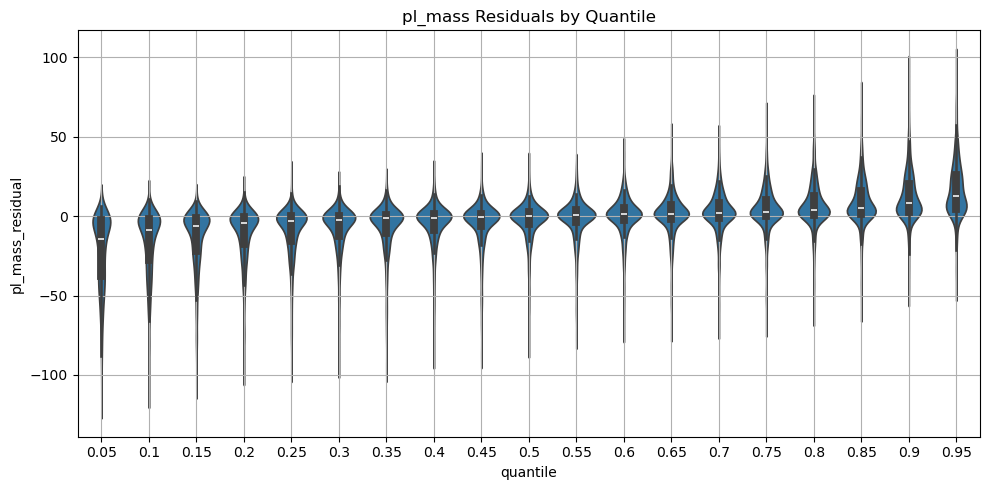

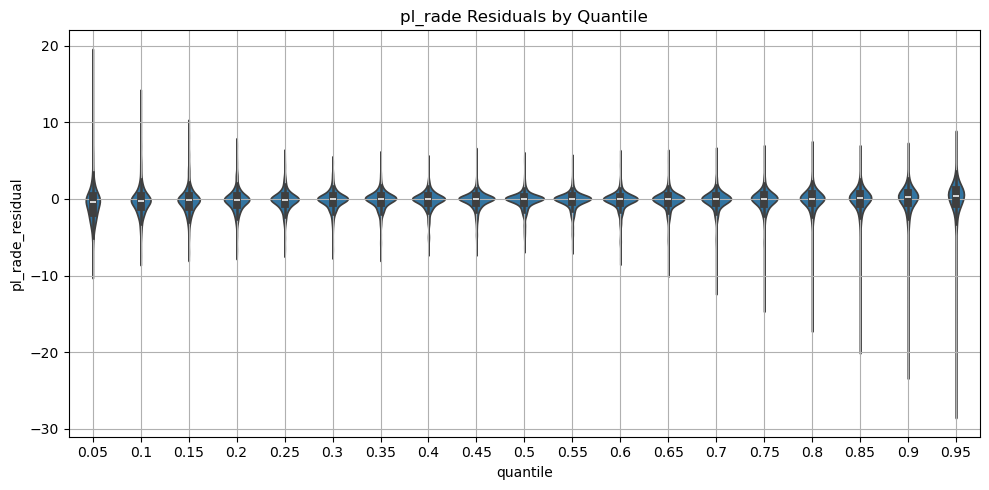

Index(['X_test_index', 'quantile', 'pl_mass_pred', 'pl_rade_pred', 'pl_mass',
       'pl_rade', 'pl_radeerr', 'pl_mass_residual', 'pl_rade_residual',
       'pl_mass_interval_width', 'pl_rade_interval_width'],
      dtype='object')


In [73]:
df = pd.read_csv("quantile_predictions.csv")

# step 1: add residuals
df["pl_mass_residual"] = df["pl_mass_pred"] - df["pl_mass"]
df["pl_rade_residual"] = df["pl_rade_pred"] - df["pl_rade"]

# step 2: compute interval widths
# pivot the data to get lower and upper bound per sample
intervals_mass = df.pivot(index="X_test_index", columns="quantile", values="pl_mass_pred")
intervals_rade = df.pivot(index="X_test_index", columns="quantile", values="pl_rade_pred")

# assume quantiles are sorted and use 0.75 - 0.25 as IQR
interval_df = pd.DataFrame({
    "X_test_index": intervals_mass.index,
    "pl_mass_interval_width": intervals_mass[0.75] - intervals_mass[0.25],
    "pl_rade_interval_width": intervals_rade[0.75] - intervals_rade[0.25],
})

# ensure X_test_index is just a column in both DataFrames before merge
df = df.reset_index(drop=True)
interval_df = interval_df.reset_index(drop=True)

#merge
df = df.merge(interval_df, on="X_test_index", how="left")

#plot separate violin plots for mass and radius
plt.figure(figsize=(10, 5))
sns.violinplot(x="quantile", y="pl_mass_residual", data=df)
plt.title("pl_mass Residuals by Quantile")
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 5))
sns.violinplot(x="quantile", y="pl_rade_residual", data=df)
plt.title("pl_rade Residuals by Quantile")
plt.grid(True)
plt.tight_layout()
plt.show()

print(df.columns)

Make Altair Plots

In [74]:
quantile_df = df

# Create a dict of lower/upper bounds for each sample and target
interval_bounds = quantile_df[quantile_df["quantile"].isin([0.25, 0.75])]

# Pivot to get bounds
mass_bounds = interval_bounds.pivot(index="X_test_index", columns="quantile", values="pl_mass_pred")
rade_bounds = interval_bounds.pivot(index="X_test_index", columns="quantile", values="pl_rade_pred")

# Merge into quantile_df
quantile_df = quantile_df.merge(
    mass_bounds.rename(columns={0.25: "pl_mass_lower", 0.75: "pl_mass_upper"}),
    on="X_test_index", how="left"
)
quantile_df = quantile_df.merge(
    rade_bounds.rename(columns={0.25: "pl_rade_lower", 0.75: "pl_rade_upper"}),
    on="X_test_index", how="left"
)

# Add boolean coverage columns
quantile_df["pl_mass_covered"] = (
    (quantile_df["pl_mass"] >= quantile_df["pl_mass_lower"]) &
    (quantile_df["pl_mass"] <= quantile_df["pl_mass_upper"])
)
quantile_df["pl_rade_covered"] = (
    (quantile_df["pl_rade"] >= quantile_df["pl_rade_lower"]) &
    (quantile_df["pl_rade"] <= quantile_df["pl_rade_upper"])
)

print(quantile_df.columns)

Index(['X_test_index', 'quantile', 'pl_mass_pred', 'pl_rade_pred', 'pl_mass',
       'pl_rade', 'pl_radeerr', 'pl_mass_residual', 'pl_rade_residual',
       'pl_mass_interval_width', 'pl_rade_interval_width', 'pl_mass_lower',
       'pl_mass_upper', 'pl_rade_lower', 'pl_rade_upper', 'pl_mass_covered',
       'pl_rade_covered'],
      dtype='object')


In [75]:
# Ensure Altair is allowed to see all rows
alt.data_transformers.disable_max_rows()

# Convert boolean to string for color mapping
quantile_df["pl_mass_covered_str"] = quantile_df["pl_mass_covered"].map({True: "Covered", False: "Uncovered"})

# Create slider selection
quantile_slider = alt.binding_range(min=quantile_df["quantile"].min(),
                                    max=quantile_df["quantile"].max(),
                                    step=0.05,
                                    name="Quantile: ")
select_quantile = alt.selection_point(name="Quantile", fields=["quantile"], bind=quantile_slider)

# Base chart
mass_chart = alt.Chart(quantile_df).mark_circle(size=60).encode(
    x=alt.X("pl_mass_pred", title="Predicted pl_mass"),
    y=alt.Y("pl_mass", title="True pl_mass"),
    color=alt.Color("pl_mass_covered_str:N",
                    scale=alt.Scale(domain=["Covered", "Uncovered"], range=["green", "red"]),
                    title="Interval Coverage"),
    tooltip=[
        "X_test_index", "quantile", "pl_mass_pred", "pl_mass", "pl_mass_residual",
        "pl_mass_lower", "pl_mass_upper", "pl_mass_interval_width", "pl_mass_covered"
    ]
).add_params(
    select_quantile
).transform_filter(
    select_quantile
).properties(
    width=600, height=400,
    title="pl_mass: Predicted vs True with Interval Coverage (Quantile Adjustable)"
).interactive()

mass_chart

c:\Users\Lauren\anaconda3\Lib\site-packages\altair\utils\core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.Chart(...)

In [76]:
# Ensure Altair is allowed to see all rows
alt.data_transformers.disable_max_rows()

# Convert boolean to string for color mapping
quantile_df["pl_rade_covered_str"] = quantile_df["pl_rade_covered"].map({True: "Covered", False: "Uncovered"})

# Create slider selection
quantile_slider = alt.binding_range(min=quantile_df["quantile"].min(),
                                    max=quantile_df["quantile"].max(),
                                    step=0.05,
                                    name="Quantile: ")
select_quantile = alt.selection_point(name="Quantile", fields=["quantile"], bind=quantile_slider)

# Base chart
mass_chart = alt.Chart(quantile_df).mark_circle(size=60).encode(
    x=alt.X("pl_rade_pred", title="Predicted pl_rade"),
    y=alt.Y("pl_rade", title="True pl_rade"),
    color=alt.Color("pl_rade_covered_str:N",
                    scale=alt.Scale(domain=["Covered", "Uncovered"], range=["green", "red"]),
                    title="Interval Coverage"),
    tooltip=[
        "X_test_index", "quantile", "pl_rade_pred", "pl_rade", "pl_rade_residual",
        "pl_rade_lower", "pl_rade_upper", "pl_rade_interval_width", "pl_rade_covered"
    ]
).add_params(
    select_quantile
).transform_filter(
    select_quantile
).properties(
    width=600, height=400,
    title="pl_rade: Predicted vs True with Interval Coverage (Quantile Adjustable)"
).interactive()

mass_chart

c:\Users\Lauren\anaconda3\Lib\site-packages\altair\utils\core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
c:\Users\Lauren\anaconda3\Lib\site-packages\altair\utils\core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.Chart(...)

In [ ]:
import altair as alt
import pandas as pd

alt.data_transformers.disable_max_rows()

# === Create shared slider for coverage ===
slider = alt.binding_range(min=10, max=90, step=10, name="Coverage (%) ")
coverage_selector = alt.param("coverage", bind=slider, value=50)

def get_interval_plot(target: str, label: str):
    rows = []
    for cov in range(10, 100, 10):
        lower_q = round((100 - cov) / 200, 3)
        upper_q = round(1 - lower_q, 3)

        df_med = quantile_df[quantile_df["quantile"] == 0.5].copy()
        df_low = quantile_df[quantile_df["quantile"] == lower_q].copy()
        df_high = quantile_df[quantile_df["quantile"] == upper_q].copy()

        merged = df_med[["X_test_index", f"{target}_pred", target]].rename(columns={f"{target}_pred": "pred"})
        merged["lower"] = df_low.set_index("X_test_index").loc[merged["X_test_index"]][f"{target}_pred"].values
        merged["upper"] = df_high.set_index("X_test_index").loc[merged["X_test_index"]][f"{target}_pred"].values
        merged["coverage"] = cov
        merged["covered"] = (merged[target] >= merged["lower"]) & (merged[target] <= merged["upper"])
        rows.append(merged)

    df = pd.concat(rows)

    base = alt.Chart(df).add_params(coverage_selector).transform_filter(
        f"datum.coverage == coverage"
    )

    points = base.mark_point(filled=True, size=60).encode(
        x=alt.X(f"{target}:Q", title=f"True {label}"),
        y=alt.Y("pred:Q", title=f"Predicted {label}"),
        color=alt.condition("datum.covered", alt.value("green"), alt.value("red")),
        tooltip=["X_test_index", target, "pred", "lower", "upper", "covered"]
    )

    errorbars = base.mark_errorbar().encode(
        x=alt.X(f"{target}:Q"),
        y="lower:Q",
        y2="upper:Q"
    )

    return (errorbars + points).properties(width=350, height=350, title=f"{label}: Prediction vs True")

# === Combine both mass and radius plots ===
mass_plot = get_interval_plot("pl_mass", "Mass")
rade_plot = get_interval_plot("pl_rade", "Radius")

final_chart = alt.hconcat(mass_plot, rade_plot).add_params(coverage_selector).resolve_scale(color="independent")

final_chart.display()


alt.HConcatChart(...)

R^2 and Error Values for Median

In [78]:
# 🔹 load Predictions
predictions_df = pd.read_csv("multi_target_quantile_median_predictions.csv")

# 🔹 extract actual and predicted values
y_true_1 = predictions_df["pl_mass"]
y_pred_1 = predictions_df["pl_mass_pred"]
y_true_2 = predictions_df["pl_rade"]
y_pred_2 = predictions_df["pl_rade_pred"]

# 🔹 Compute Metrics for Each Target
metrics = {
    "Target": ["Planet Mass", "Planet Radius"],
    "MAE": [mean_absolute_error(y_true_1, y_pred_1), mean_absolute_error(y_true_2, y_pred_2)],
    "MSE": [mean_squared_error(y_true_1, y_pred_1), mean_squared_error(y_true_2, y_pred_2)],
    "RMSE": [np.sqrt(mean_squared_error(y_true_1, y_pred_1)), np.sqrt(mean_squared_error(y_true_2, y_pred_2))],
    "R² Score": [r2_score(y_true_1, y_pred_1), r2_score(y_true_2, y_pred_2)],
}

# 🔹 Convert to DataFrame for Display
metrics_df = pd.DataFrame(metrics)

# 🔹 Print Performance Metrics
print(metrics_df)

          Target       MAE         MSE       RMSE  R² Score
0    Planet Mass  7.766859  189.956001  13.782453  0.891093
1  Planet Radius  0.702874    1.342808   1.158796  0.923177


Data for Classification

In [79]:
df_class = pd.read_csv("tess_data.csv")

#drop the features that aren't known for classification
drop_features_class=["pl_radeerr"] 
df_class = df_class.drop(columns = drop_features_class) 

#fill NAs in disposition with 0
df_class['tfopwg_disp'] = df_class['tfopwg_disp'].fillna(0) 

exclude_columns = 'tfopwg_disp'
columns_to_fill = df_class.columns.difference([exclude_columns])
means = df_class[columns_to_fill].mean()
df_class[columns_to_fill] = df_class[columns_to_fill].fillna(means) #fill NAs in all other columns with mean

#df_class = df_class.fillna(df_class.mean())
print(df_class.head())


         tid     toi  pl_mass  ...  st_feherr  st_mass  st_masserr
0  231663901  101.01   115.19  ...   0.058435     1.05    0.129454
1  336732616  103.01   116.75  ...   0.058435     1.27    0.196969
2  231670397  104.01   121.75  ...   0.058435     1.16    0.166129
3  144065872  105.01   122.95  ...   0.058435     1.03    0.127209
4  289793076  108.01    99.64  ...   0.058435     0.95    0.135858

[5 rows x 38 columns]


In [80]:
target_columns_class = ['tfopwg_disp']

X_class = df_class.drop(columns ='tfopwg_disp')
y_class = df_class[target_columns_class]

# split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_class, y_class, test_size=0.2)

In [81]:
#train classifier
clf = RandomForestClassifier(n_estimators=316, max_depth=19, min_samples_leaf=1, min_samples_split=2)

clf.fit(X_train, y_train)

c:\Users\Lauren\anaconda3\Lib\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier(max_depth=19, n_estimators=316)

In [82]:
#make predictions
y_pred = clf.predict(X_test)

In [83]:
#print accuracy, precision, and recall
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='micro')


print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)

Accuracy: 0.8629032258064516
Precision: 0.8676001930983224
Recall: 0.8629032258064516


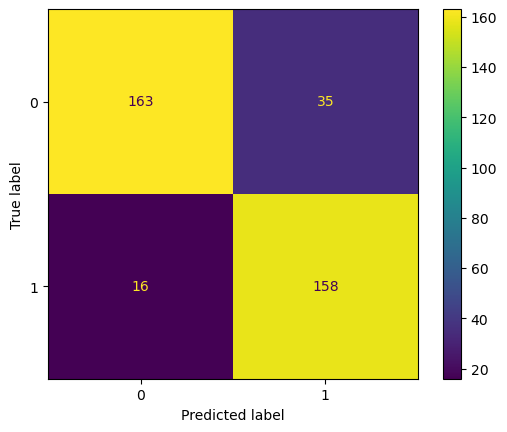

In [ ]:
# create the confusion matrix
cm = confusion_matrix(y_test, y_pred)

ConfusionMatrixDisplay(confusion_matrix=cm).plot()

<Axes: >

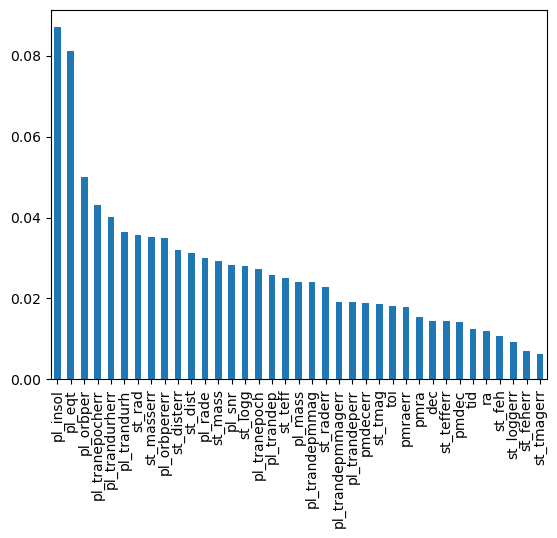

In [85]:
# create a series containing feature importances from the model and feature names from the training data
feature_importances = pd.Series(clf.feature_importances_, index=X_train.columns).sort_values(ascending=False)

# plot a simple bar chart
feature_importances.plot.bar()

Code to put on Website

In [86]:
# Make sure the directory exists
os.makedirs("models", exist_ok=True)

# Save your models
joblib.dump(clf, "models/rf_classifier.pkl")

['models/rf_classifier.pkl']